In [1]:
# Importing necessary libraries
import os
import shutil
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Define the input path and separate output paths for images and labels
input_path = "/kaggle/input/wadaba"
output_images_path = "/kaggle/working/wadaba/images"
output_labels_path = "/kaggle/working/wadaba/labels"

# Create output folders for images and labels if they don't exist
os.makedirs(output_images_path, exist_ok=True)
os.makedirs(output_labels_path, exist_ok=True)

# Iterate through each folder in the input path
for folder_name in os.listdir(input_path):
    folder_path = os.path.join(input_path, folder_name)

    # Check if it's a folder
    if os.path.isdir(folder_path):
        # Create corresponding folders in images and labels output directories
        image_dest_folder = os.path.join(output_images_path, folder_name)
        label_dest_folder = os.path.join(output_labels_path, folder_name)
        os.makedirs(image_dest_folder, exist_ok=True)
        os.makedirs(label_dest_folder, exist_ok=True)

        # Separate images and labels
        for file_name in os.listdir(folder_path):
            file_path = os.path.join(folder_path, file_name)

            # If the file is an image, copy it to the images folder
            if file_name.endswith('.jpg') and os.path.isfile(file_path):
                shutil.copy(file_path, image_dest_folder)

            # If the file is a label, copy it to the labels folder
            elif file_name.endswith('.txt') and os.path.isfile(file_path):
                shutil.copy(file_path, label_dest_folder)

print("Images and labels have been separated into different directories.")


Images and labels have been separated into different directories.


In [3]:
# Define the path to your labels directory
labels_dir = "/kaggle/working/wadaba/labels"
# Iterate through each class folder in the labels directory
for folder in os.listdir(labels_dir):
    folder_path = os.path.join(labels_dir, folder)
    
    if os.path.isdir(folder_path):
        for label_file in os.listdir(folder_path):
            if label_file.endswith('.txt'):
                label_file_path = os.path.join(folder_path, label_file)
                
                # Read the existing labels
                with open(label_file_path, 'r') as f:
                    lines = f.readlines()

                # Modify the labels
                new_lines = []
                for line in lines:
                    parts = line.split()
                    # Assuming the first part is the class index
                    if len(parts) > 0:
                        # Convert class index from zero-padded string to integer
                        class_index = int(parts[0]) - 1  # Convert to 0-index
                        new_line = f"{class_index} " + " ".join(parts[1:]) + "\n"
                        new_lines.append(new_line)

                # Write back the modified labels
                with open(label_file_path, 'w') as f:
                    f.writelines(new_lines)

print("Label files updated.")

Label files updated.


In [4]:

# Define the data directories
parent_dir = "/kaggle/working/wadaba/images"  # Directory where image folders are located
label_dir = "/kaggle/working/wadaba/labels"  # Directory where label folders are located
train_dir = "/kaggle/working/wadaba/train"
val_dir = "/kaggle/working/wadaba/val"

# Create directories for training and validation if they don't exist
for folder in ['PS', 'PET', 'PP', 'Other', 'PE_HD']:
    os.makedirs(os.path.join(train_dir, folder), exist_ok=True)
    os.makedirs(os.path.join(val_dir, folder), exist_ok=True)

# Function to split dataset
def split_dataset(image_list, split_ratio=0.8):
    train_size = int(len(image_list) * split_ratio)
    train_files, val_files = train_test_split(image_list, train_size=train_size, shuffle=True)
    return train_files, val_files

# Iterate through each class folder and split images and their corresponding labels
for folder in ['PS', 'PET', 'PP', 'Other', 'PE_HD']:
    folder_path = os.path.join(parent_dir, folder)
    label_folder_path = os.path.join(label_dir, folder)

    # Collect all .jpg files
    all_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]

    # Split into train and validation sets
    train_files, val_files = split_dataset(all_files)

    # Move training files (images and corresponding labels)
    for file_name in train_files:
        # Copy image
        shutil.copy(os.path.join(folder_path, file_name), os.path.join(train_dir, folder, file_name))
        # Copy corresponding label (if exists)
        label_file_name = file_name.replace('.jpg', '.txt')
        if os.path.exists(os.path.join(label_folder_path, label_file_name)):
            shutil.copy(os.path.join(label_folder_path, label_file_name), os.path.join(train_dir, folder, label_file_name))

    # Move validation files (images and corresponding labels)
    for file_name in val_files:
        # Copy image
        shutil.copy(os.path.join(folder_path, file_name), os.path.join(val_dir, folder, file_name))
        # Copy corresponding label (if exists)
        label_file_name = file_name.replace('.jpg', '.txt')
        if os.path.exists(os.path.join(label_folder_path, label_file_name)):
            shutil.copy(os.path.join(label_folder_path, label_file_name), os.path.join(val_dir, folder, label_file_name))

print("Dataset splitting complete.")

Dataset splitting complete.


# YOLO Model

In [5]:
# setup
%pip install ultralytics>=8.3.0
import ultralytics
ultralytics.checks()


Ultralytics 8.3.27 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5933.9/8062.4 GB disk)


In [6]:
dataset_yaml = """
train: /kaggle/working/wadaba/train
val: /kaggle/working/wadaba/val

nc: 7  # number of classes
names: [ 'PET', 'PE_HD', 'PVC', 'PE_LD','PP', 'PS', 'Other']  # class names
"""

with open('/kaggle/working/yolov11n.yaml', 'w') as file:
    file.write(dataset_yaml)

In [7]:
import os
os.environ['WANDB_MODE'] = 'disabled'

In [8]:
from ultralytics import settings

settings.update({"wandb": False})

In [9]:
from ultralytics import YOLO

# Load the trained YOLO model
model = YOLO('yolo11n.pt')
data_yaml_path = "/kaggle/working/yolov11n.yaml"



results = model.train(data = data_yaml_path,
            epochs=20,
            device=0,
            lr0=0.01,  # initial learning rate
            lrf=0.001,  # final learning rate
            save_period=10
           )

100%|██████████| 5.35M/5.35M [00:00<00:00, 62.3MB/s]


Ultralytics 8.3.27 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/kaggle/working/yolov11n.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=10, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True,

100%|██████████| 755k/755k [00:00<00:00, 13.6MB/s]
2024-11-04 18:07:55,430	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-11-04 18:07:56,615	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=7

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/working/wadaba/train/Other... 3199 images, 2 backgrounds, 0 corrupt: 100%|██████████| 3200/3200 [00:03<00:00, 983.47it/s]


train: New cache created: /kaggle/working/wadaba/train/Other.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.14). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/wadaba/val/Other... 800 images, 0 backgrounds, 0 corrupt: 100%|██████████| 800/800 [00:00<00:00, 895.35it/s]


val: New cache created: /kaggle/working/wadaba/val/Other.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      2.41G      1.076      2.389      1.273         37        640: 100%|██████████| 200/200 [01:07<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:11<00:00,  2.21it/s]

                   all        800        800       0.65      0.615      0.579      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      2.37G      1.031      1.406      1.207         34        640: 100%|██████████| 200/200 [01:05<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.40it/s]

                   all        800        800      0.829      0.709      0.684      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      2.37G      1.024      1.152      1.182         32        640: 100%|██████████| 200/200 [01:04<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.38it/s]

                   all        800        800      0.778      0.586      0.618      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      2.37G       1.01     0.9885      1.159         30        640: 100%|██████████| 200/200 [01:05<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:09<00:00,  2.53it/s]


                   all        800        800      0.797      0.666      0.706      0.547

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      2.37G     0.9919     0.8721      1.156         33        640: 100%|██████████| 200/200 [01:05<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.42it/s]

                   all        800        800      0.879      0.741      0.783      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      2.37G     0.9712     0.7983      1.139         40        640: 100%|██████████| 200/200 [01:04<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.36it/s]

                   all        800        800      0.847      0.718      0.779      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      2.37G     0.9666     0.7497       1.13         37        640: 100%|██████████| 200/200 [01:05<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.45it/s]

                   all        800        800       0.72      0.886      0.889      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      2.37G     0.9615     0.7192       1.13         33        640: 100%|██████████| 200/200 [01:05<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:09<00:00,  2.57it/s]

                   all        800        800      0.801      0.847      0.896       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      2.37G     0.9352      0.661      1.114         37        640: 100%|██████████| 200/200 [01:06<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:09<00:00,  2.52it/s]


                   all        800        800      0.883      0.909       0.95      0.752

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      2.37G      0.927     0.6493      1.114         34        640: 100%|██████████| 200/200 [01:06<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.49it/s]

                   all        800        800      0.882      0.938      0.944       0.76


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      2.37G     0.8182     0.5327      1.069         16        640: 100%|██████████| 200/200 [01:06<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.40it/s]

                   all        800        800      0.861       0.91      0.923       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      2.37G      0.821     0.4856      1.065         16        640: 100%|██████████| 200/200 [01:04<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.49it/s]

                   all        800        800      0.863      0.851      0.891      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      2.37G      0.804     0.4716      1.058         16        640: 100%|██████████| 200/200 [01:04<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.37it/s]

                   all        800        800      0.877      0.902      0.953      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      2.37G     0.7877     0.4319      1.045         16        640: 100%|██████████| 200/200 [01:04<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.40it/s]

                   all        800        800      0.889      0.935      0.972      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      2.37G     0.7841     0.4122      1.039         16        640: 100%|██████████| 200/200 [01:03<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.41it/s]

                   all        800        800      0.982      0.992      0.993      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      2.37G     0.7669     0.3847      1.031         16        640: 100%|██████████| 200/200 [01:04<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.43it/s]

                   all        800        800      0.957      0.963      0.994        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      2.37G     0.7647     0.3677      1.026         16        640: 100%|██████████| 200/200 [01:03<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.47it/s]

                   all        800        800      0.984      0.971      0.991       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      2.37G     0.7516      0.344      1.019         16        640: 100%|██████████| 200/200 [01:03<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.38it/s]

                   all        800        800      0.951      0.971      0.992      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      2.37G     0.7421     0.3262      1.012         16        640: 100%|██████████| 200/200 [01:03<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.42it/s]

                   all        800        800      0.992      0.987      0.993      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      2.37G     0.7271     0.3111      1.009         16        640: 100%|██████████| 200/200 [01:04<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.49it/s]

                   all        800        800      0.993      0.984      0.995      0.825



20 epochs completed in 0.426 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.27 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.32it/s]


                   all        800        800      0.993      0.984      0.995      0.823
                   PET        440        440          1      0.987      0.995      0.822
                 PE_HD        120        120          1      0.976      0.995      0.828
                    PP        128        128      0.975      0.984      0.995      0.795
                    PS        104        104          1      0.972      0.995      0.825
                 Other          8          8      0.992          1      0.995      0.848
Speed: 0.1ms preprocess, 1.8ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/train


## Model Evaluation

In [10]:
from PIL import Image

In [11]:
tpaths2=[]
for dirname, _, filenames in os.walk('/kaggle/working/runs/detect/train'):
    for filename in filenames:
        if filename[-4:]=='.png' or filename[-4:]=='.jpg':
            tpaths2+=[(os.path.join(dirname, filename))]
tpaths2=sorted(tpaths2)

print(tpaths2[0])

/kaggle/working/runs/detect/train/F1_curve.png


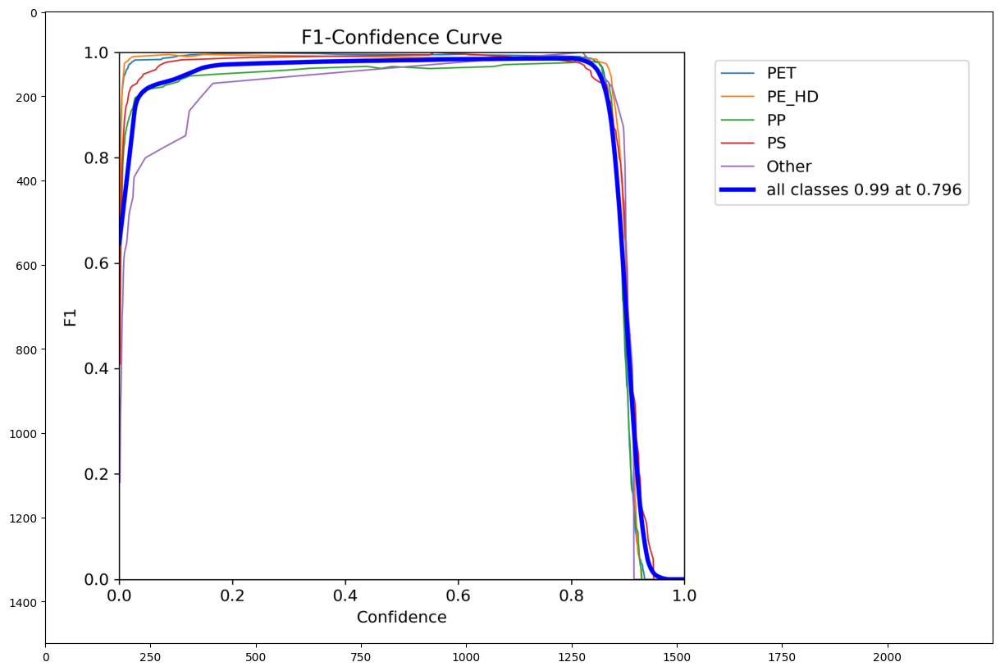

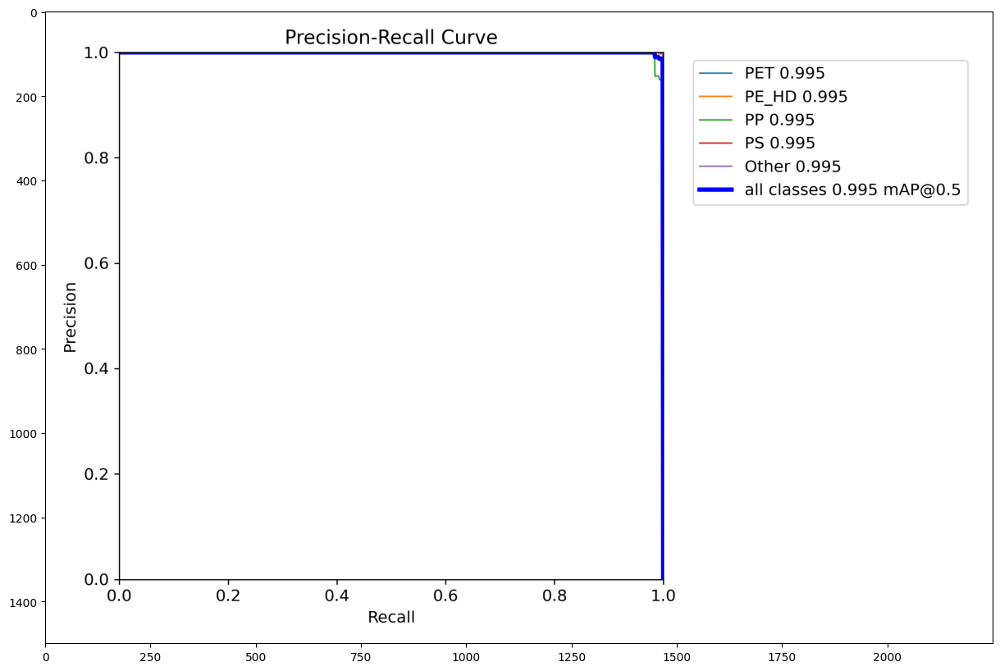

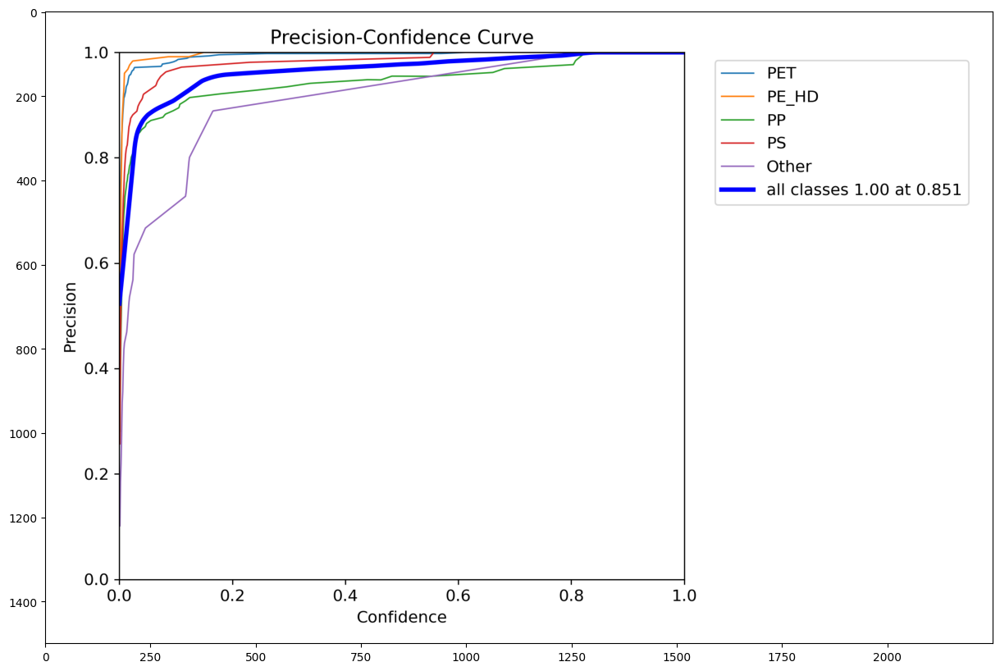

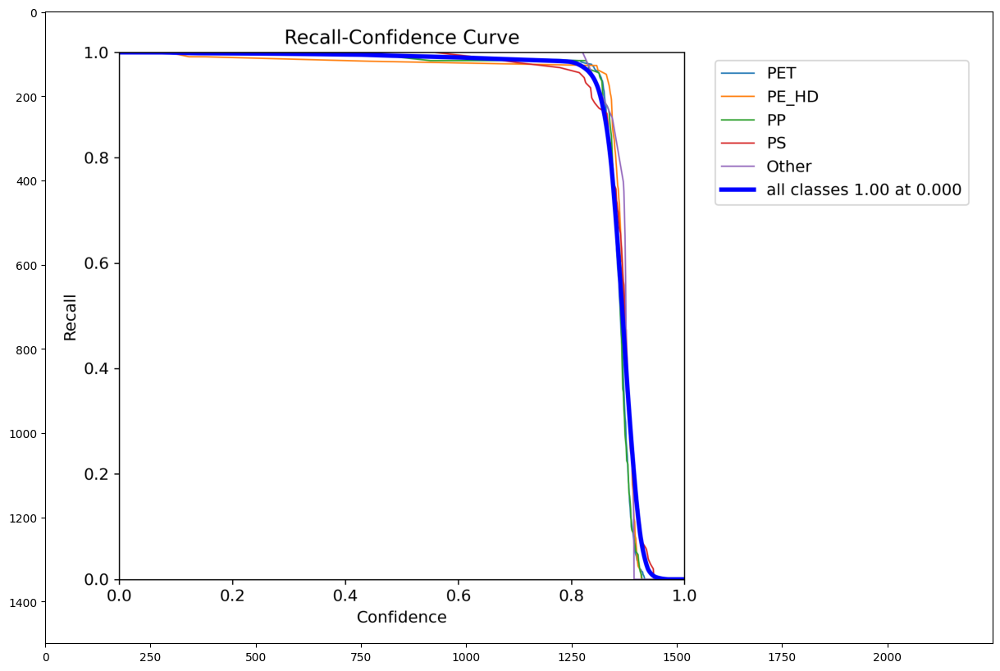

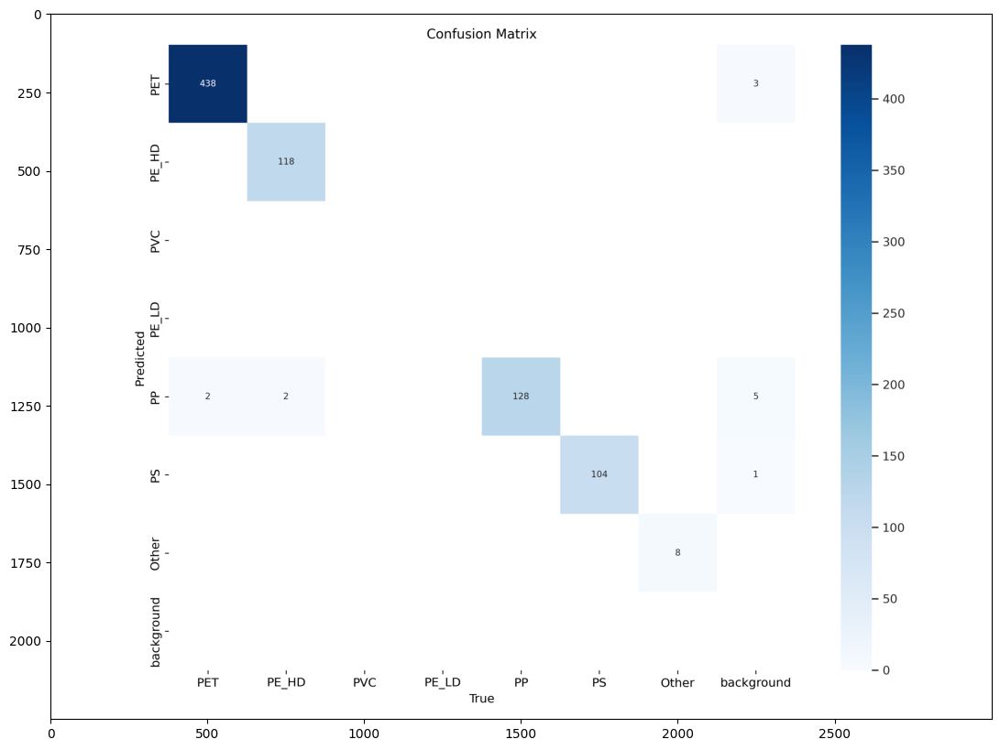

...

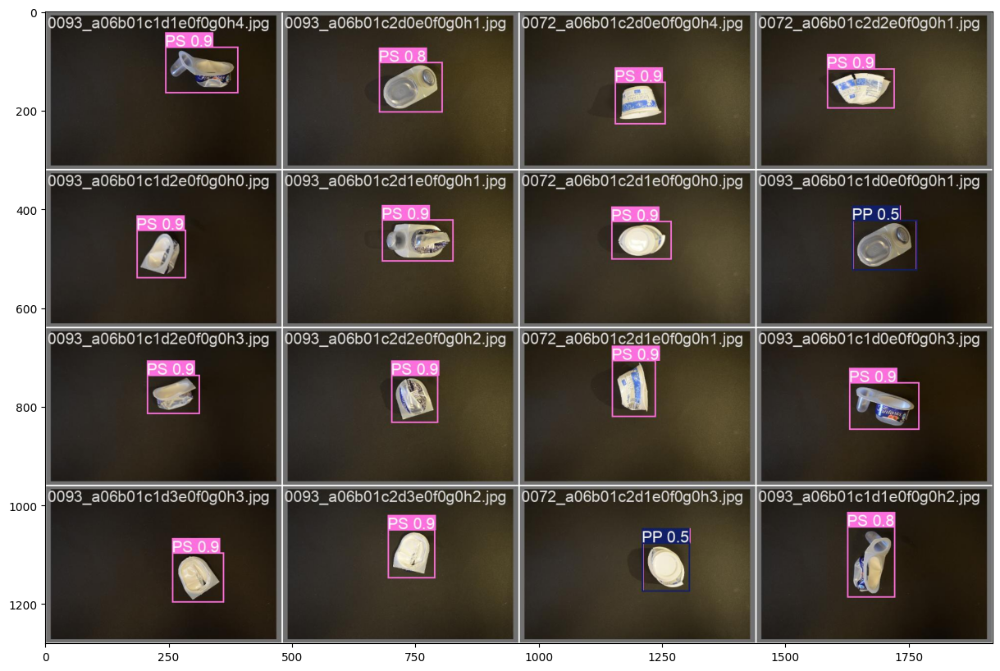

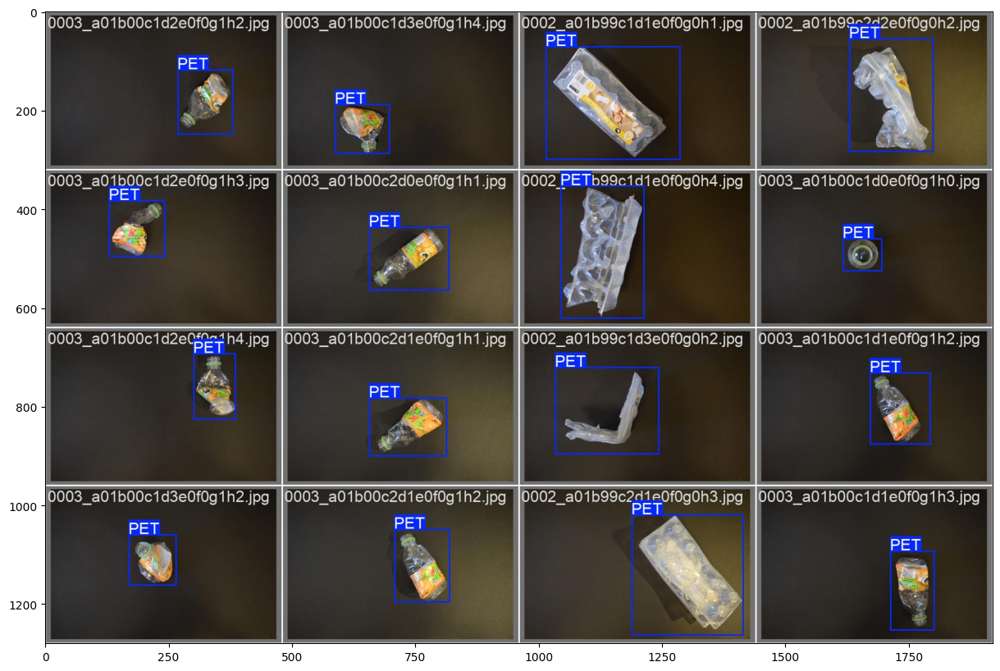

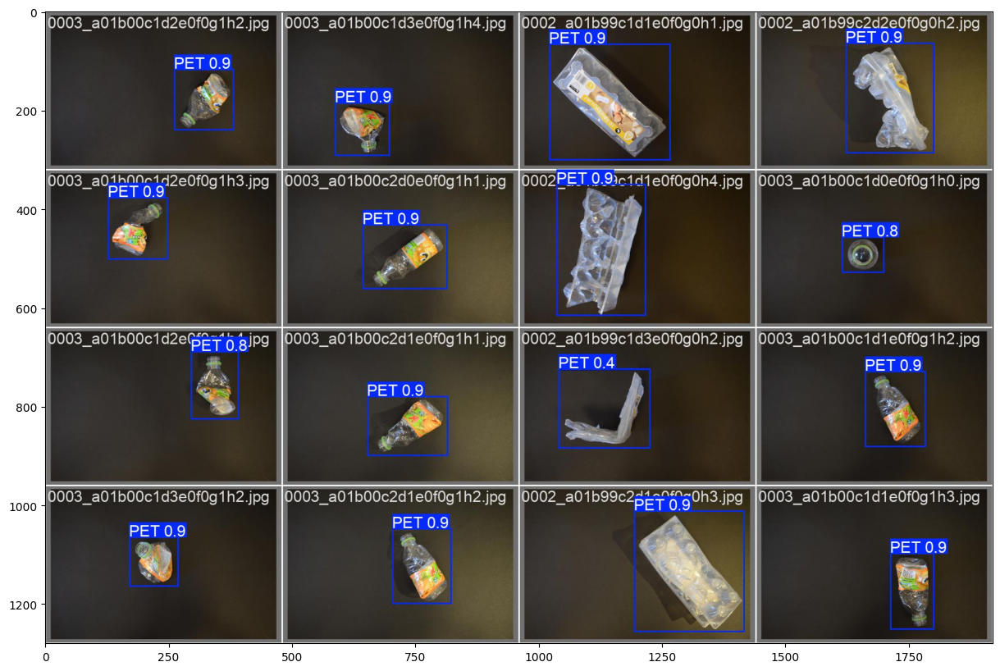

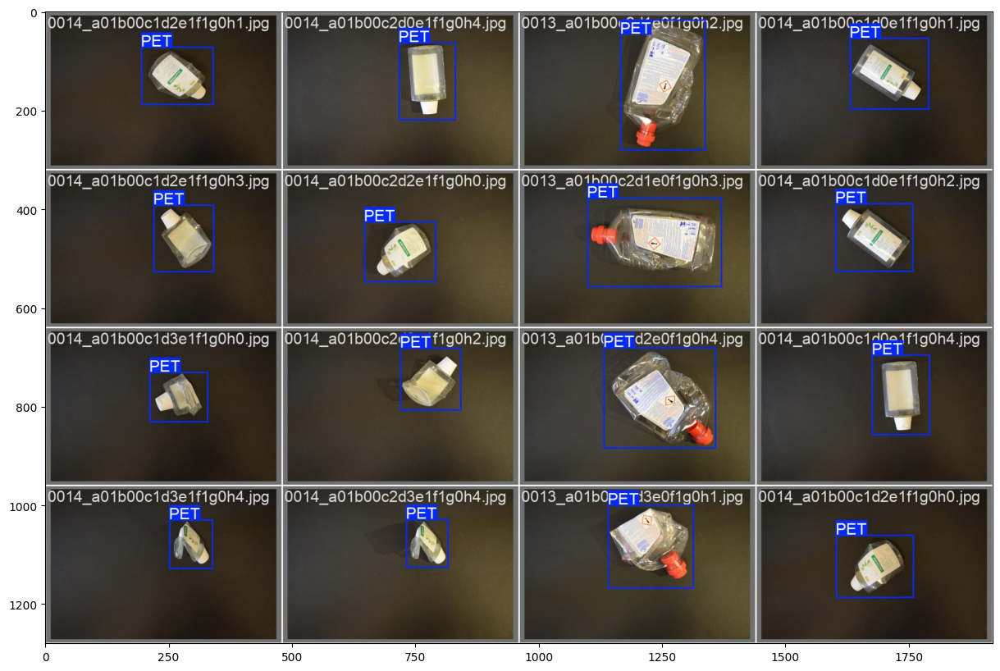

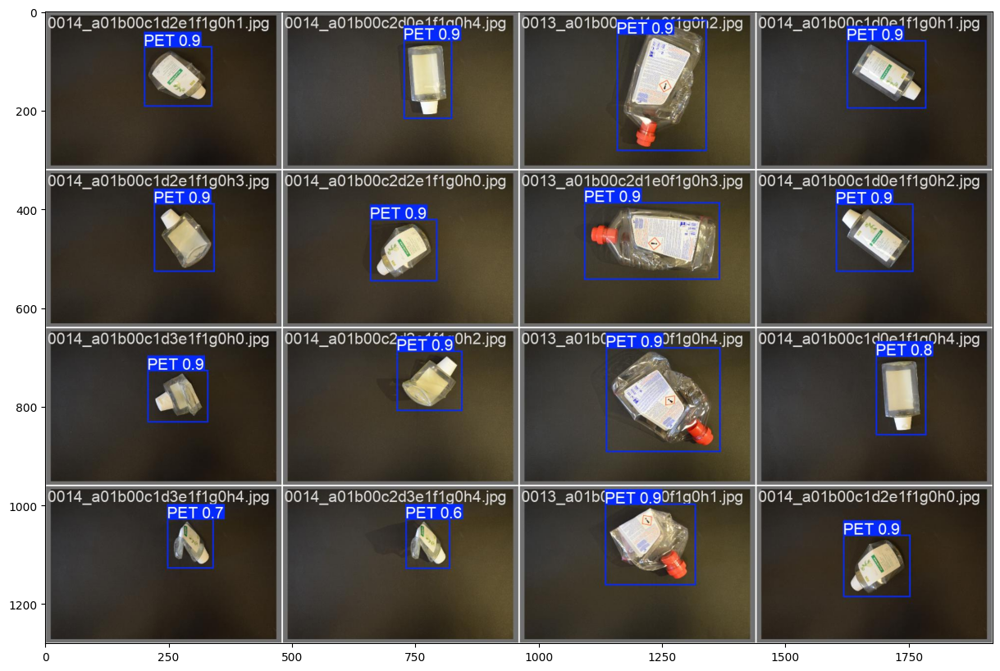

In [12]:
for path in tpaths2:
    image = Image.open(path)
    image=np.array(image)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show()

In [13]:
# evaluate model performance on the validation set
results = model.val() 

Ultralytics 8.3.27 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /kaggle/working/wadaba/val/Other.cache... 800 images, 0 backgrounds, 0 corrupt: 100%|██████████| 800/800 [00:00<?, ?it/s]
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:12<00:00,  3.92it/s]


                   all        800        800      0.993      0.984      0.995      0.823
                   PET        440        440          1      0.987      0.995      0.823
                 PE_HD        120        120          1      0.977      0.995      0.829
                    PP        128        128      0.975      0.984      0.995      0.794
                    PS        104        104          1      0.972      0.995      0.823
                 Other          8          8      0.992          1      0.995      0.848
Speed: 0.2ms preprocess, 2.9ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/train2


In [14]:
# Access precision, recall, and F1-score
# metrics = results['metrics']  # Contains metrics like precision, recall, and F1-score

# Access precision, recall, and F1-score for all classes
precision = results.box.mean_results()[0]  # mean precision
recall = results.box.mean_results()[1]     # mean recall
f1_score = results.box.mean_results()[2]   # mean F1-score

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1_score:.4f}")


Precision: 0.9933
Recall: 0.9839
F1-score: 0.9949


In [15]:
# Calculate approximate accuracy
# Accuracy = (TP) / (TP + FP + FN)
accuracy = (precision * recall) / (precision + recall - (precision * recall))
print(f"Accuracy: {accuracy:.4f}")

Accuracy: 0.9774


## Testing
Let's test image on test datasets.

In [16]:
import cv2
import random


image 1/1 /kaggle/working/wadaba/val/PET/0081_a01b04c2d2e0f1g0h1.jpg: 448x640 1 PET, 49.9ms
Speed: 3.4ms preprocess, 49.9ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


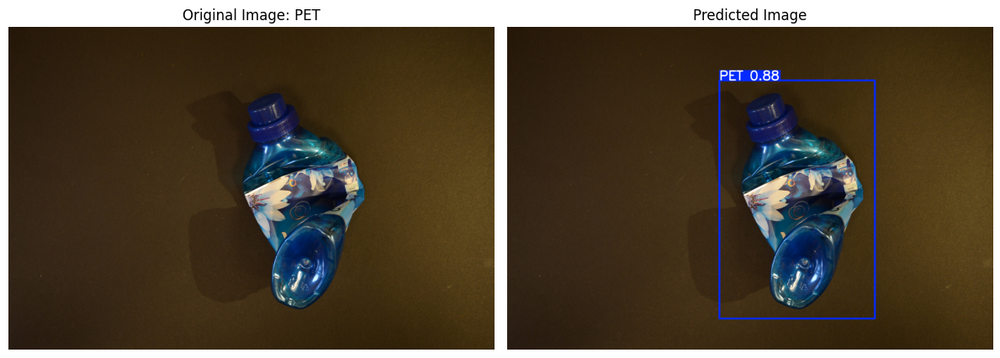


image 1/1 /kaggle/working/wadaba/val/PE_HD/0075_a02b01c2d3e0f0g0h1.jpg: 448x640 1 PE_HD, 9.4ms
Speed: 2.4ms preprocess, 9.4ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


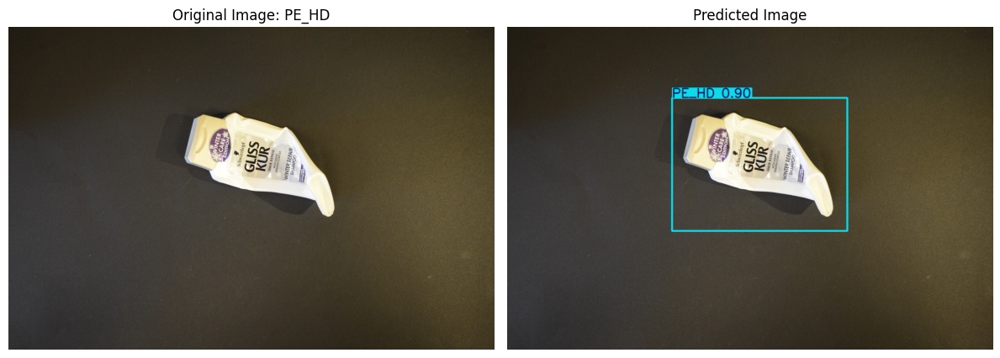


image 1/1 /kaggle/working/wadaba/val/PET/0013_a01b00c2d2e0f1g0h4.jpg: 448x640 1 PET, 9.4ms
Speed: 2.3ms preprocess, 9.4ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


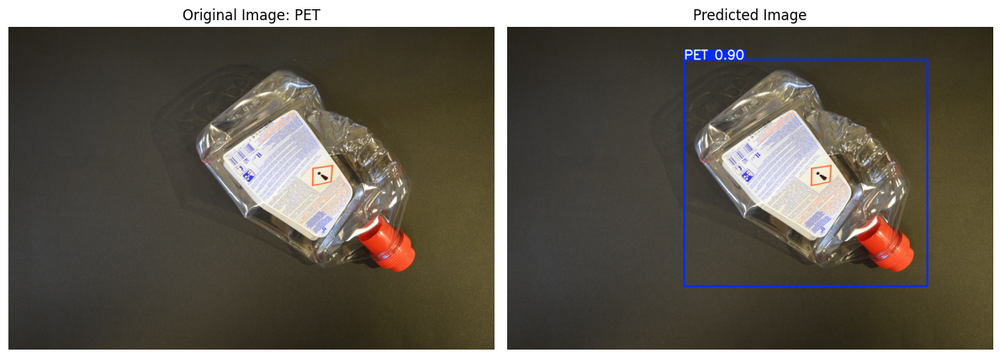


image 1/1 /kaggle/working/wadaba/val/PS/0058_a06b01c2d3e0f0g0h3.jpg: 448x640 1 PS, 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


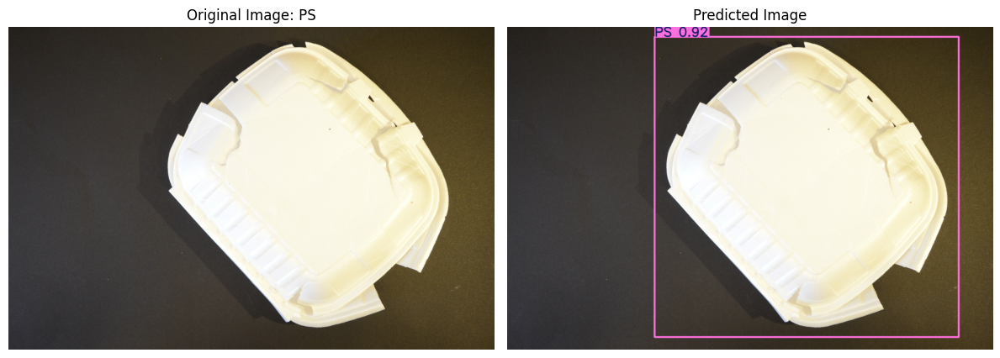


image 1/1 /kaggle/working/wadaba/val/PET/0052_a01b00c1d1e0f0g1h1.jpg: 448x640 1 PET, 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


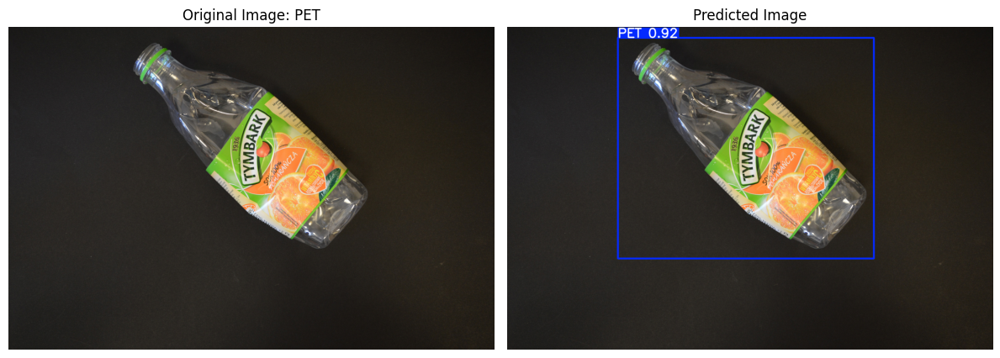

In [17]:
from PIL import Image
import matplotlib.pyplot as plt

# Define the path to the images
images_path = '/kaggle/working/wadaba/val'
num_images = 5
output_dir = '/kaggle/working/saved_images'  # Define output directory for saved images

# Create output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Collect all images with .jpeg extension from the main folder and subfolders
all_images = []
for root, _, files in os.walk(images_path):
    for file in files:
        if file.endswith('.jpg'):
            all_images.append(os.path.join(root, file))

# Check if there are any images to sample
if not all_images:
    raise ValueError("No .jpeg images found in the specified path.")

# Sample a subset of images, ensuring the number of images sampled is not greater than available images
images = random.sample(all_images, min(num_images, len(all_images)))

# Show the original and predicted images side by side
for image in images:
    # Read the original image
    original_image = cv2.imread(image)

    # Extract folder name from the path
    folder_name = os.path.basename(os.path.dirname(image))
    image_name = os.path.basename(image)

    # Process the image to get the prediction
    results = model(image, conf=0.5, iou=0.6)
    r = results[0]
    im_array = r.plot()  # plot a BGR numpy array of predictions

    # Convert the prediction from BGR to RGB for displaying with PIL
    im_rgb = cv2.cvtColor(im_array, cv2.COLOR_BGR2RGB)
    predicted_image = Image.fromarray(im_rgb)

    # Save the original and predicted images
    original_save_path = os.path.join(output_dir, f'original_{image_name}')
    predicted_save_path = os.path.join(output_dir, f'predicted_{image_name}')
    
    # Save original image using OpenCV
    cv2.imwrite(original_save_path, original_image)
    # Save predicted image using PIL (you can also use cv2.imwrite for this)
    predicted_image.save(predicted_save_path, format='JPEG')  # Specify format if needed

    # Plot the original and predicted images
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
    axes[0].set_title(f'Original Image: {folder_name}')
    axes[0].axis('off')

    axes[1].imshow(predicted_image)
    axes[1].set_title('Predicted Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()


## Export  YOLO Models for mobile or embedded devices.

We need to export the models as `.tflite` and `.mlmodel` files to ensure they are compatible with mobile and embedded devices. To achieve this, we will use the Ultralytics YOLO CLI for model export.

In [18]:
# Android
!yolo export format=tflite model="/kaggle/working/runs/detect/train/weights/best.pt" imgsz=320 int8 # For detection

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


Ultralytics 8.3.27 🚀 Python-3.10.14 torch-2.4.0 CPU (Intel Xeon 2.00GHz)
WARNING ⚠️ INT8 export requires a missing 'data' arg for calibration. Using default 'data=coco8.yaml'.
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

PyTorch: starting from '/kaggle/working/runs/detect/train/weights/best.pt' with input shape (1, 3, 320, 320) BCHW and output shape(s) (1, 11, 2100) (5.2 MB)
requirements: Ultralytics requirements ['sng4onnx>=1.0.1', 'onnx_graphsurgeon>=0.3.26', 'onnx2tf>1.17.5,<=1.22.3', 'onnxslim>=0.1.31', 'tflite_support', 'onnxruntime'] not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.6/136.6 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.4/56.4 kB 209.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 435.0/435.0 kB 33.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 kB 246.9 

In [19]:
# iOS
# !yolo export format=mlmodel model="/kaggle/working/runs/detect/train/weights/best.pt" imgsz=320,192 half nms